# Final Project


Submitted by: *Alexey Vasyanovich 319618989, Nir Yaakov 311119788*


In [98]:
%matplotlib inline
import scipy
import numpy as np
import matplotlib.pyplot as plt
import cv2
import json
from PIL import Image
import urllib.request
import os
from glob import glob 

image working size is : (688, 1224)


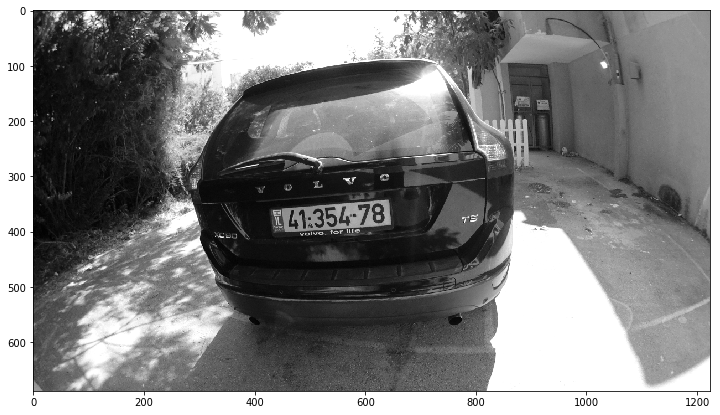

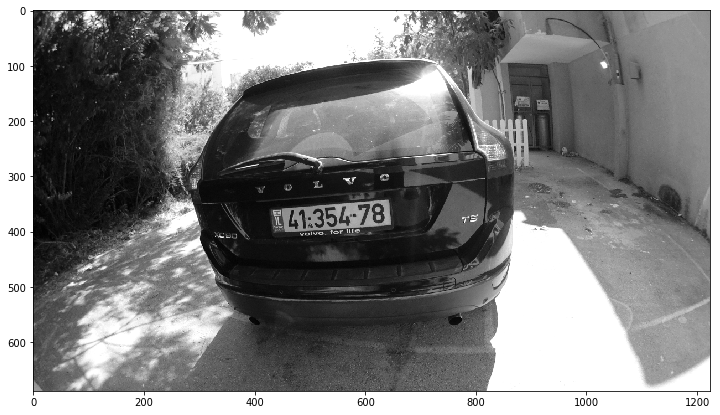

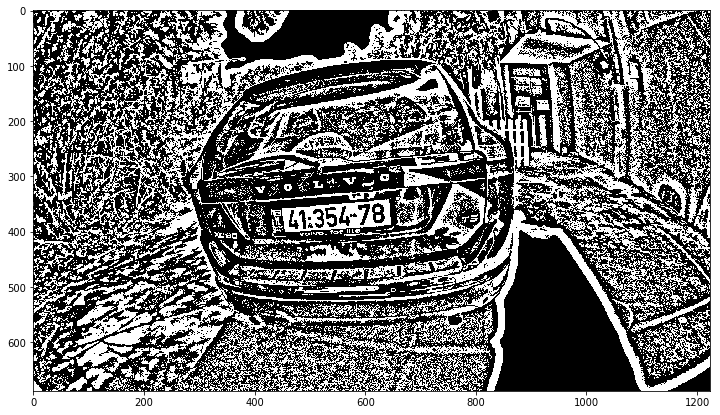

In [99]:
img = cv2.imread("auto1.jpg", 0)
img = cv2.resize(img, (0,0), fx=0.25,fy=0.25)
print("image working size is :", img.shape)

plt.figure(figsize=(17,7))
plt.imshow(img, cmap="gray")
plt.show()

img_blur = cv2.GaussianBlur(img, (5,5), 0)

plt.figure(figsize=(17,7))
plt.imshow(img, cmap="gray")
plt.show()

thresh = cv2.adaptiveThreshold(img,1,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,33,0)
plt.figure(figsize=(17,7))
plt.imshow(thresh, cmap="gray")
plt.show()

### importing Israeli License plates photos from "dataturks.com" and saving it locally :


In [100]:
 
# i=0
# cropping_data = []
# with open('Israeli license plates.json') as f:
#     for line in f:
#         i+=1
#         item = json.loads(line)
#         # urllib.request.urlretrieve(item["content"], "dataturks\\%d.jpg"%i)      # loading the actual photo from server
#         cropping_data.append(item["annotation"][0]["points"])                    # loading the cropping data from JSON



### cropping images using JSON data:


In [101]:

# i=0
# for item in cropping_data:
#     i += 1
#     img = cv2.imread("dataturks\\%d.jpg"%i)
#     im = img[int(item[0]["y"]*224):int(item[1]["y"]*224), int(item[0]["x"]*224):int(item[1]["x"]*224)]
#     cv2.imwrite("dataset\\%d.jpg"%i ,im)

# #renaming some files for convienient further use: 

# i=0
# for filename in os.listdir("licenseplates_dataset"):
#     i+=1
#     src = "licenseplates_dataset/" + filename
#     dst = "licenseplates_dataset/" + str(i+664) + ".jpg"
#     os.rename(src, dst)
#     #("licenseplates_dataset\\%d"%i)


### initializing HOG descriptors for each photo and creating proper dataset for training:


descriptor size: 2016


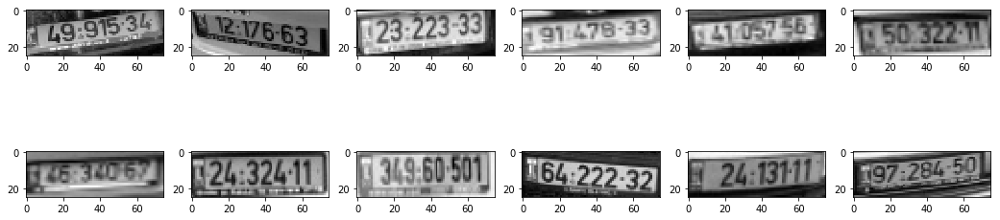

In [102]:

winSize = (75,25)  # examples size are 50 rows x 150 cols  pixels
blockSize = (10,10)
blockStride = (5,5)
cellSize = (5,5)
nbins = 9
hog = cv2.HOGDescriptor(winSize,blockSize,blockStride,cellSize,nbins) 
print("descriptor size:", hog.getDescriptorSize())
### get data and initialize X matrix 

i=0
j=1
X = np.zeros((682, hog.getDescriptorSize()), dtype=np.float32)
labels = np.ones(682, dtype=np.float32) 
plt.figure(figsize=(18,5))

for path in glob("dataset\\*.jpg"):
    img = cv2.imread(path,0)
    img = cv2.resize(img,hog.winSize)
    
    print(img.shape, end="\r")
    
    X[i] = hog.compute(img).reshape(hog.getDescriptorSize())
    i+=1
    if(j<=12):
        plt.subplot(2,6,j)
        plt.imshow(img, cmap="gray")#cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        j+=1
        
plt.show()


### getting negative examples from "nonlicenseplates" folder, similarly as done in EX7:


In [103]:

import random

def getRandomwindows(img, n=70, size=(25,75)):
    
    h,w = img.shape
    hh,ww = size

    nonfaces = np.zeros((n, hog.getDescriptorSize()))
    if(h<=hh or w<=ww):
        return nonfaces;

    for i in range(n):
        x = np.random.randint(w-size[1])
        y = np.random.randint(h-size[0])
        rand_window = img[y:y+size[0], x:x+size[1]]
        #print(rand_window.shape)
        
        nonfaces[i] = hog.compute(rand_window).reshape(hog.getDescriptorSize())
         
    return nonfaces    
    

nonfaces = np.zeros((0,hog.getDescriptorSize()))


for path in glob("nonlicenseplates\*.jpg"):
    img = cv2.imread(path,0)
    nonfaces = np.append(nonfaces, getRandomwindows(img), axis=0)


print(nonfaces.shape)    
labels = np.append(labels, np.ones(nonfaces.shape[0])*-1, axis=0)

X = np.append(X, nonfaces, axis=0)

print("\n")
print(labels.shape)
print(X.shape)


(5180, 2016)


(5862,)
(5862, 2016)


In [104]:
# SVM Model: 

svm = cv2.ml.SVM_create()

svm.setType(cv2.ml.SVM_C_SVC)
svm.setKernel(cv2.ml.SVM_LINEAR)
svm.setTermCriteria((cv2.TERM_CRITERIA_COUNT, 100, 1e-6))

X = X.astype(dtype=np.float32)
labels = labels.astype(dtype=np.int32)

print(X.dtype , X.shape)
print(labels.dtype , labels.shape)

svm.train(X, cv2.ml.ROW_SAMPLE, labels)

### HOG detector with SVM classifier

sv = svm.getSupportVectors()
rho,alpha,tmp = svm.getDecisionFunction(0)
sv = np.append(-alpha*sv,rho)

hog.setSVMDetector(sv)  

def detectPlate(img, hit_thresh=0.9):
    
    img_copy = img.copy()    
    img_copy = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.GaussianBlur(img,(5,5),0)
    
    rects, weights = hog.detectMultiScale(img, winStride=(4,4), scale=1.5, hitThreshold=hit_thresh, finalThreshold=2)
    
    for (x, y, w, h), weight in zip(rects, weights):
        cv2.rectangle(img_copy, (x, y), (x + w, y + h), (100, 255*weight[0], 200), 3)


    plt.figure(figsize=(18,10))
    plt.imshow(img_copy)#, cmap='gray', interpolation='nearest')
    plt.show()



float32 (5862, 2016)
int32 (5862,)


### testing some street images:

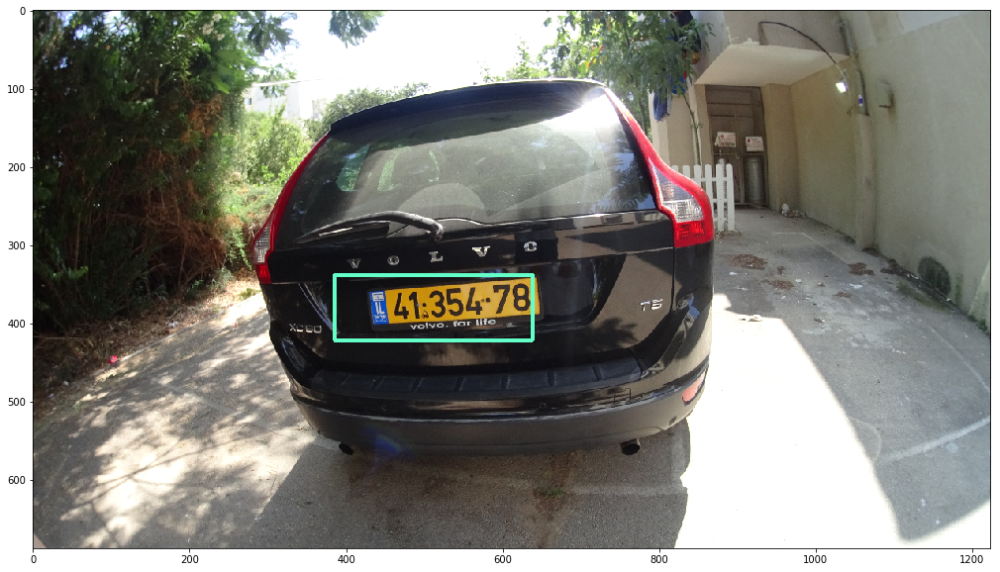

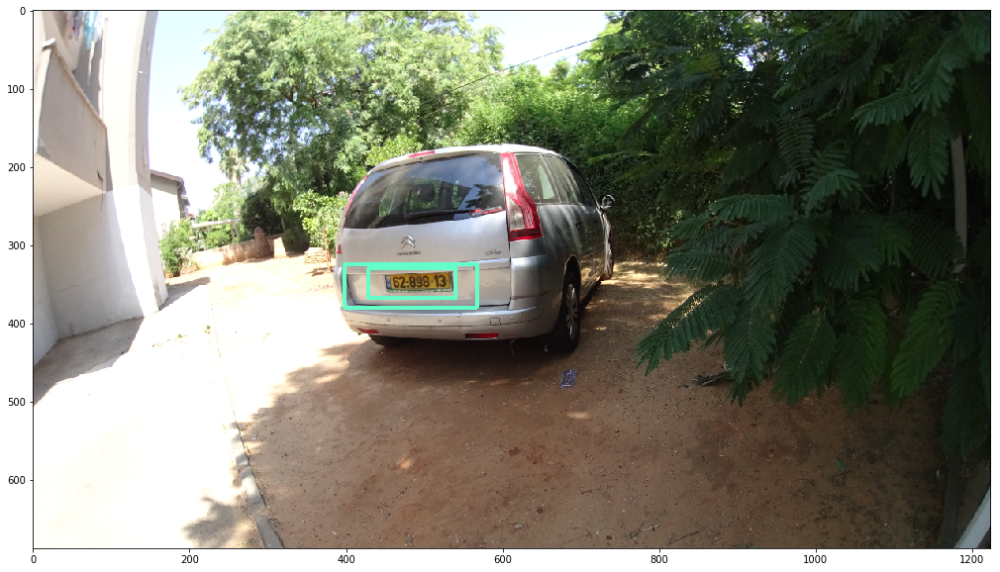

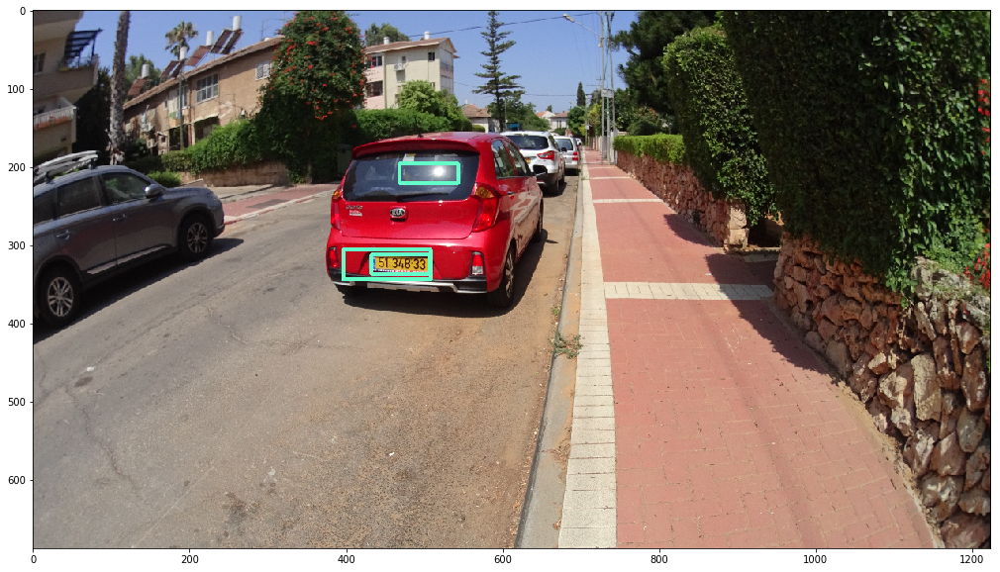

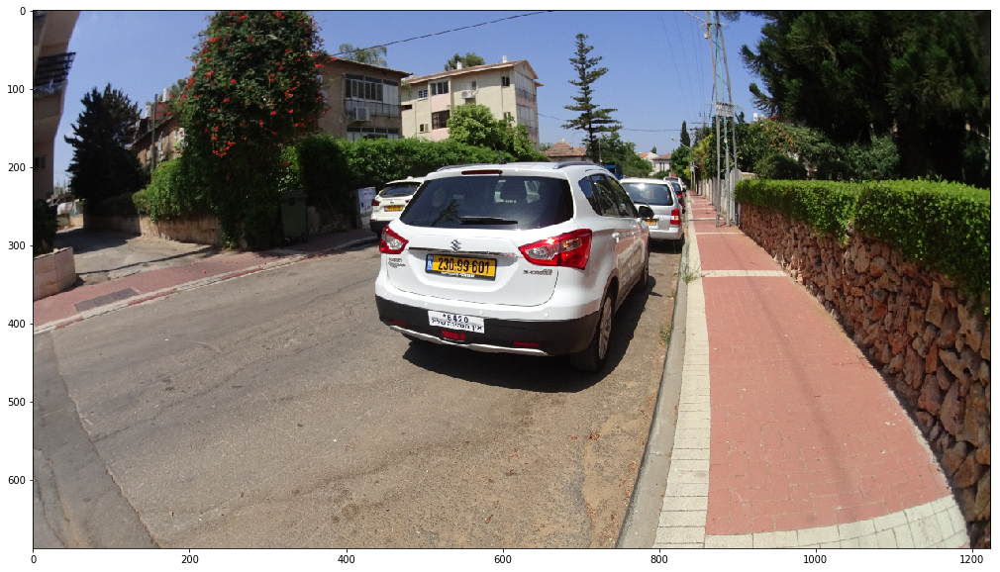

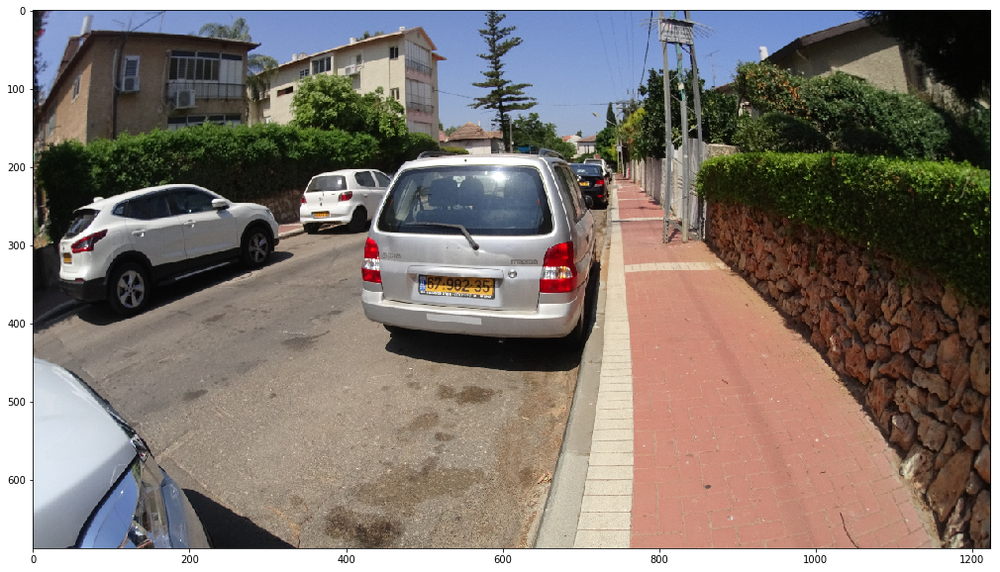

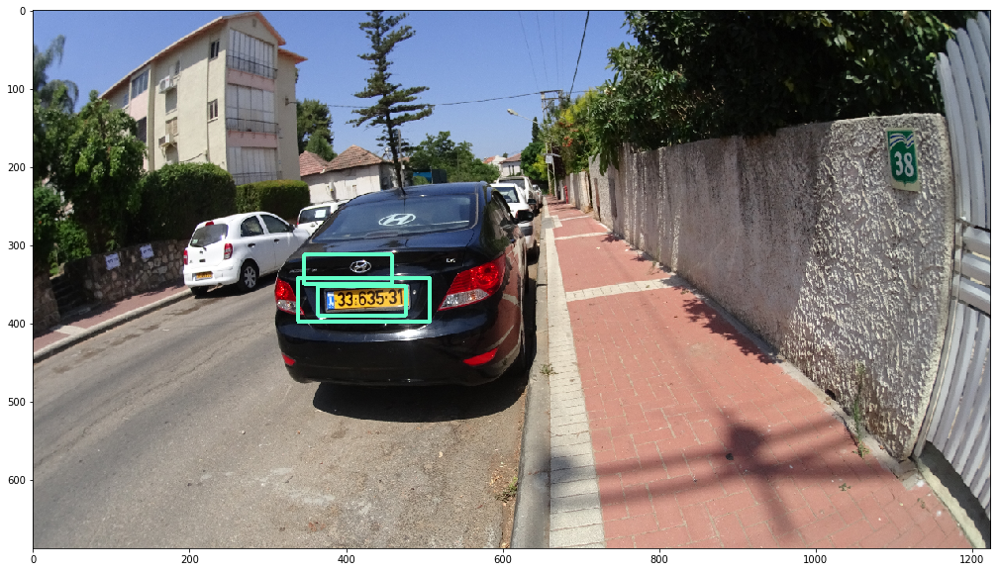

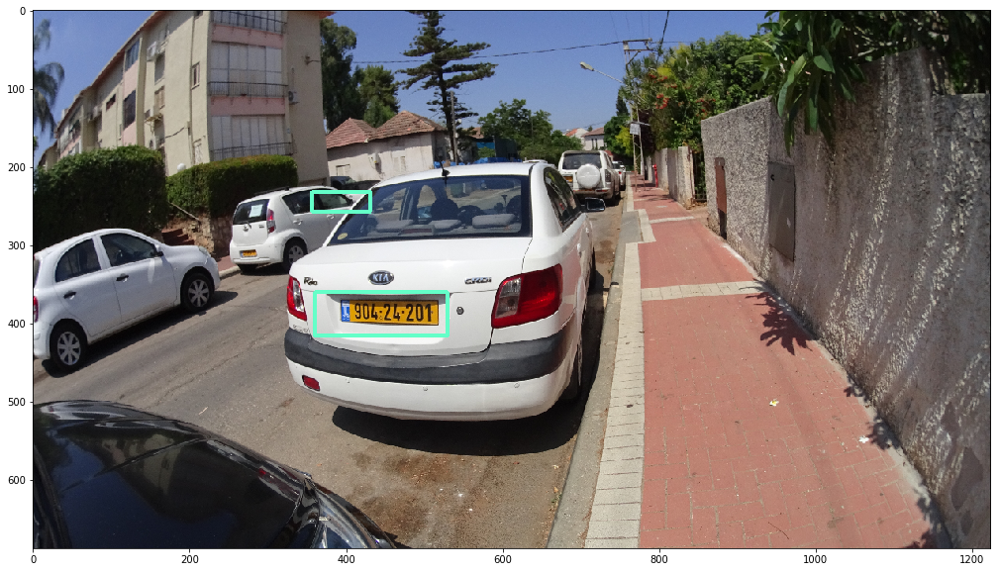

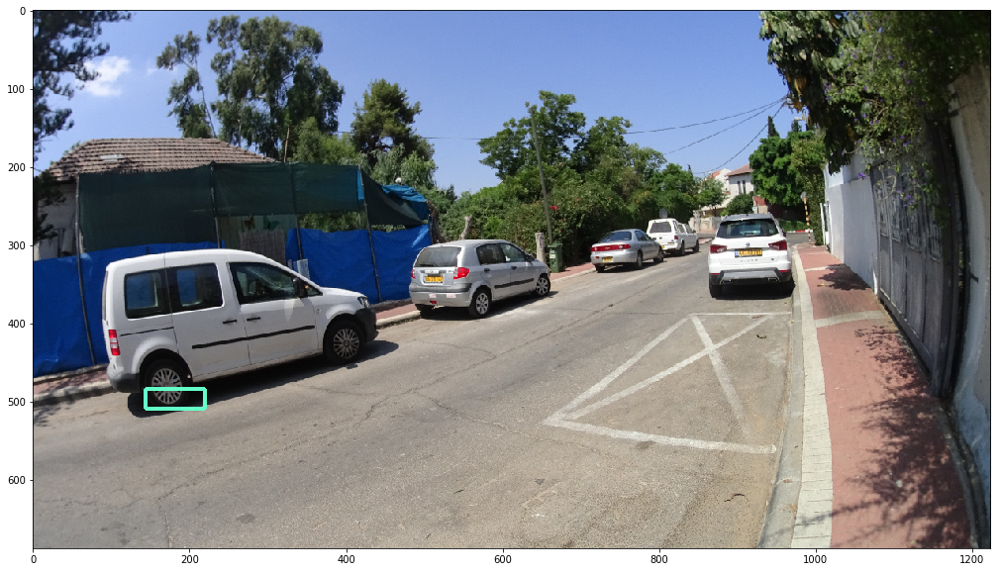

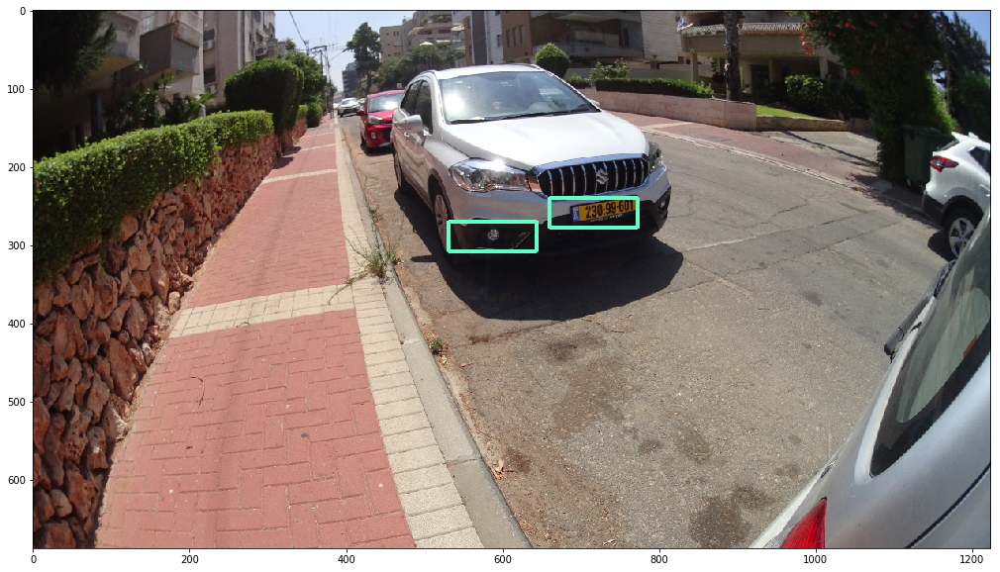

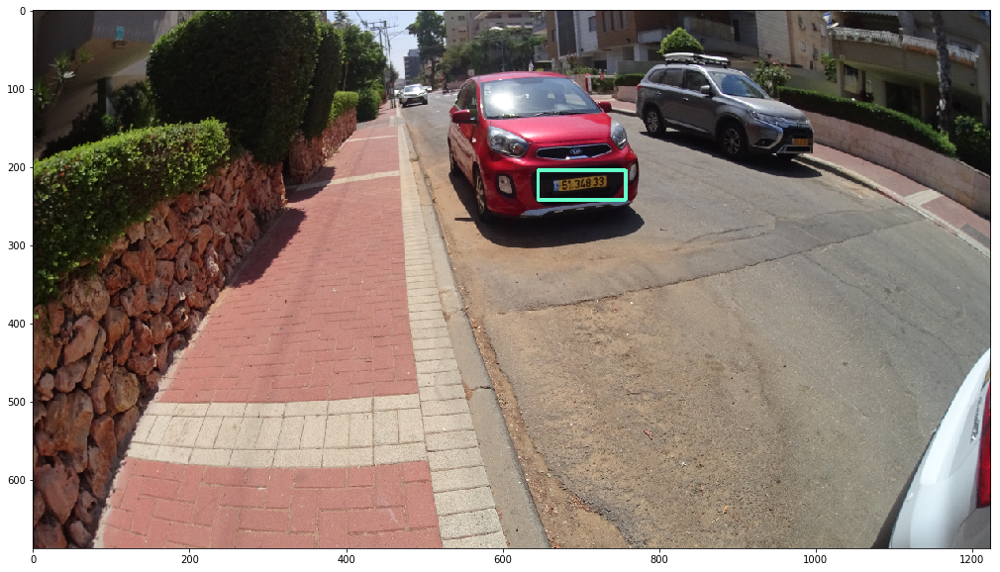

In [105]:
for path in glob("car_photos\\*.jpg"):
    img = cv2.imread(path)
    img = cv2.resize(img, (0,0), fx= 0.25, fy = 0.25)
    detectPlate(img)

### now we will try to adjust parameters and apply this method to video shooting:

In [106]:
def detectPlate(img, hit_thresh=0.99):
    
    
    img = cv2.resize(img, (0,0), fx=0.5, fy=0.5)
    img_copy = img.copy()    
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.GaussianBlur(img,(5,5),0)
    
    rects, weights = hog.detectMultiScale(img, winStride=(4,4), scale=1.1, hitThreshold=hit_thresh, finalThreshold=5)
    
    for (x, y, w, h), weight in zip(rects, weights):
        cv2.rectangle(img_copy, (x, y), (x + w, y + h), (100, 255*weight[0], 200), 3)

    return img_copy;


def PlatesDetectionVIdeo(video_in, video_out):
 
    while(video_in.isOpened()):
        ret, frame = video_in.read()
        
        if ret==False:
            break

        print(frame.shape, end="\r")
        img = detectPlate(frame)
        cv2.imshow('frame', img)
        video_out.write(img)
                        
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
            
    video_in.release()
    video_out.release()
    cv2.destroyAllWindows()


In [107]:
vid_in = cv2.VideoCapture('VID_20190714_192451.mp4')


fourcc = cv2.VideoWriter_fourcc(*'DIVX')
vid_out = cv2.VideoWriter('cars_output1.mp4',fourcc, 25.0, (640, 360))


PlatesDetectionVIdeo(vid_in, vid_out)


vid_in = cv2.VideoCapture('VID_20190714_192319.mp4')


fourcc = cv2.VideoWriter_fourcc(*'DIVX')
vid_out = cv2.VideoWriter('cars_output2.mp4',fourcc, 25.0, (640, 360))


PlatesDetectionVIdeo(vid_in, vid_out)